# Image Classification - The Multi-class Weather Dataset

**Submission deadline: Friday 5 April, 11:55pm**

**Assessment weight: 15% of the total unit assessment.**

**Versions**

- Wednesday 13 March: Initial release

*Unless a Special Consideration request has been submitted and approved, a 5% penalty (of the total possible mark of the task) will be applied for each day a written report or presentation assessment is not submitted, up until the 7th day (including weekends). After the 7th day, a grade of ‘0’ will be awarded even if the assessment is submitted. The submission time for all uploaded assessments is **11:55 pm**. A 1-hour grace period will be provided to students who experience a technical concern. For any late submission of time-sensitive tasks, such as scheduled tests/exams, performance assessments/presentations, and/or scheduled practical assessments/labs, please apply for [Special Consideration](https://students.mq.edu.au/study/assessment-exams/special-consideration).*

In this assignment you will complete tasks for an end-to-end image classification application. We will train and test the data using the Multi-class Weather Dataset (MWD):

- https://data.mendeley.com/datasets/4drtyfjtfy/1

The MWD contains labelled images representing various weather scenarios. It is a small and popular dataset for practice with image classification.

# Connect to GitHub Classroom

Please follow these steps to connect:

1. Follow this invitation link and accept the invitation: https://classroom.github.com/a/TGh1XJFW
2. The link may ask you to sign in to GitHub (if you haven't signed in earlier). If you don't have a GitHub account, you will need to register.
3. Once you have logged in with GitHub, you may need to select your email address to associate your GitHub account with your email address (if you haven't done it in a previous COMP3420 activity). If you can't find your email address, please skip this step and contact diego.molla-aliod@mq.edu.au so that he can do the association manually.
4. Wait a minute or two, and refresh the browser until it indicates that your assignment repository has been created. Your repository is private to you, and you have administration privileges. Only you and the lecture will have access to it. The repository will be listed under the list of repositories belonging to this offering of COMP3420: https://github.com/orgs/COMP3420-2024S1/repositories
5. In contrast with assignment 1 and the practical sessions, your assignment repository will be empty and will not include starter code. you need to add this Jupyter notebook and commit the changes.

Please use the github repository linked to this GitHub classroom. Make sure that you continuously push commits and you provide useful commit comments. Note the following:

*  **1 mark of the assessment of this assignment is related to good practice with the use of GitHub.**
*  **We will also use github as a tool to check for possible plagiarism or contract cheating. For example, if someone only makes commits on the last day, we may investigate whether there was plagiarism or contract cheating.**


# Tasks
## Task 1 - Data exploration, preparation, and partition (4 marks)

Download the MWD from this site and unzip it:

- https://data.mendeley.com/datasets/4drtyfjtfy/1

You will observe that the zipped file contains 1,125 images representing various weather conditions. To facilitate the assessment of this assignment, please make sure that the images are in a folder named `dataset2` and this folder is in the same place as this jupyter notebook.

### 1.1 - data partition (2 marks)

Generate three CSV files named `my_training.csv`, `my_validation.csv`, and `my_test.csv` that partition the dataset into the training, validation, and test set. Each CSV file contains the following two fields:

- File path
- Image label

For example, the file `my_training.csv` could start like this:

```csv
dataset2/cloudy1.jpg,cloudy
dataset2/shine170.jpg,shine
dataset2/shine116.jpg,shine
```

Make sure that the partitions are created randomly, so that the label distribution is similar in each partition. Also, make sure that the samples are sorted in no particular order (randomly)

Display the label distribution of each partition, and display the first 10 rows of each partition.

The following sample files are available together with these instructions. Your files should look similar to these.

- `training.csv`
- `validation.csv`
- `test.csv`

**For the subsequent tasks in this assignment, use the files we provide (`training.csv`, `validation.csv`, `test.csv`). Do not use the files that you have generated, so that any errors generated by your solution do not carry to the rest of the assignment. Also, the files we provide conveniently removed references to images that have a number of channels different from 3.**




##### To Generate 3 different files : my_training.csv, my_validation.csv, and my_test.csv

In [1]:
import os
import pandas as pd
from sklearn.model_selection import train_test_split

# Path to the dataset folder
dataset_folder = 'dataset2'

# Load the dataset
data = []
for filename in os.listdir(dataset_folder):
    if filename.endswith('.jpg'):  # or any other file extension
        # Extract label by removing digits and the file extension
        label = ''.join(filter(str.isalpha, filename.split('.')[0]))
        data.append({'File path': os.path.join(dataset_folder, filename), 'Image label': label})

# Convert to DataFrame
df = pd.DataFrame(data)

# Shuffle the dataset
df = df.sample(frac=1).reset_index(drop=True)

# Split the dataset into training (80%), validation (10%), and test (10%) using stratified sampling
train, temp = train_test_split(df, test_size=0.2, stratify=df['Image label'], random_state=42)
validation, test = train_test_split(temp, test_size=0.5, stratify=temp['Image label'], random_state=42)

# Save to CSV files
train.to_csv('my_training.csv', index=False)
validation.to_csv('my_validation.csv', index=False)
test.to_csv('my_test.csv', index=False)

# Display label distribution and first 10 rows for each partition
print("Training Set Label Distribution:\n", train['Image label'].value_counts())
print("\nFirst 10 rows of Training Set:\n", train.head(10))

print("\nValidation Set Label Distribution:\n", validation['Image label'].value_counts())
print("\nFirst 10 rows of Validation Set:\n", validation.head(10))

print("\nTest Set Label Distribution:\n", test['Image label'].value_counts())
print("\nFirst 10 rows of Test Set:\n", test.head(10))


Training Set Label Distribution:
 Image label
sunrise    285
cloudy     240
shine      202
rain       170
Name: count, dtype: int64

First 10 rows of Training Set:
                     File path Image label
37       dataset2\shine61.jpg       shine
810     dataset2\shine138.jpg       shine
149      dataset2\cloudy7.jpg      cloudy
597   dataset2\sunrise117.jpg     sunrise
257   dataset2\sunrise111.jpg     sunrise
87       dataset2\rain182.jpg        rain
500   dataset2\sunrise325.jpg     sunrise
364      dataset2\rain195.jpg        rain
1023   dataset2\cloudy262.jpg      cloudy
907   dataset2\sunrise142.jpg     sunrise

Validation Set Label Distribution:
 Image label
sunrise    35
cloudy     30
shine      25
rain       22
Name: count, dtype: int64

First 10 rows of Validation Set:
                     File path Image label
624    dataset2\cloudy185.jpg      cloudy
686     dataset2\shine229.jpg       shine
786      dataset2\shine32.jpg       shine
775   dataset2\sunrise294.jpg     sunri

The dataset has been splitted into into training (80%), validation (10%), and test (10%) using stratified sampling .It can be seen that the all the csv files are in format as stated above with labels rain ,sunrise ,shine,cloudy .I have displayed first 10 rows of all three set that stats File path in format "dataset2/filename.jpg" and image label (shine,rain,sunrise,cloudy).
Moreover talking about label distribution
1. Training Set Label Distribution:
 sunrise    285,
cloudy     240,
shine      202,
rain       170
2. Validation Set Label Distribution:
 sunrise    35,
cloudy     30,
shine      25,
rain       22
3. Test Set Label Distribution:
 sunrise    36,
cloudy     30,
shine      26,
rain       21

### 1.2 - preprocessing and preparation (2 marks)

Use TensorFlow's `TextLineDataset` to generate datasets for training, validation, and test. The datasets need to produce images that are re-sized to dimensions 230 x 230 and 3 channels, and the values of the pixels must be normalised to the range [0, 1].


In [2]:
import tensorflow as tf

# Creating a StringLookup layer to map string labels to integers, including an output_mode to output one-hot vectors
label_encoder = tf.keras.layers.StringLookup(num_oov_indices=0, output_mode='one_hot')
label_encoder.adapt(["shine", "cloudy", "rain", "sunrise"])

# Functioning to parse the CSV line, load and preprocess the images, and one-hot encode the labels
def parse_csv_line(line):
    record_defaults = ['path', 'label']
    file_path, label = tf.io.decode_csv(line, record_defaults)
    image = tf.io.read_file(file_path)
    image = tf.image.decode_jpeg(image, channels=3)
    image = tf.image.resize(image, [230, 230])
    image = image / 255.0  # Normalize the pixel values
    label = label_encoder(label)  # One-hot encode the labels
    return image, label

# Defining the datasets
train_dataset = tf.data.TextLineDataset('training.csv').map(parse_csv_line)
validation_dataset = tf.data.TextLineDataset('validation.csv').map(parse_csv_line)
test_dataset = tf.data.TextLineDataset('test.csv').map(parse_csv_line)
 

# For demonstration, i have taken a single batch from each dataset and show its contents
for image, label in train_dataset.batch(1).take(1):
    print("Training set example:", image.numpy().shape, label.numpy())

for image, label in validation_dataset.batch(1).take(1):
    print("Validation set example:", image.numpy().shape, label.numpy())

for image, label in test_dataset.batch(1).take(1):
    print("Test set example:", image.numpy().shape, label.numpy())


Training set example: (1, 230, 230, 3) [[0. 1. 0. 0.]]
Validation set example: (1, 230, 230, 3) [[0. 1. 0. 0.]]
Test set example: (1, 230, 230, 3) [[0. 0. 0. 1.]]


Training set 1 row represents image size 230,230 with 3 channels and the label is 0,1,0,0 - representing cloudy with reference to label code given in accordance to this "["shine", "cloudy", "rain", "sunrise"]'.Similarly,for other example is of data from validation and test set with shape 230,230 and 3 channels

In [3]:
# For Printing pixel values from the first few images in the training set
print("Training set examples:")
for image, label in train_dataset.batch(1).take(1):
    # Print a 2x2 area from the top-left corner
    patch = image.numpy()[0][:2, :2, :]
    print("2x2 patch of pixel values from the top-left corner:")
    print(patch)
    print("Label:", label.numpy())
    # For Printing pixel values from the first few images in the training set
print("testing set examples:")
for image, label in test_dataset.batch(1).take(1):
    # Printing a 2x2 area from the top-left corner
    patch = image.numpy()[0][:2, :2, :]
    print("2x2 patch of pixel values from the top-left corner:")
    print(patch)
    print("Label:", label.numpy())
    # For Printing pixel values from the first few images in the training set
print("validation set examples:")
for image, label in validation_dataset.batch(1).take(1):
    # Print a 2x2 area from the top-left corner
    patch = image.numpy()[0][:2, :2, :]
    print("2x2 patch of pixel values from the top-left corner:")
    print(patch)
    print("Label:", label.numpy())

Training set examples:
2x2 patch of pixel values from the top-left corner:
[[[0.28627452 0.45882353 0.59607846]
  [0.28627452 0.45882353 0.59607846]]

 [[0.2802728  0.45282182 0.5900767 ]
  [0.2802728  0.45282182 0.5900767 ]]]
Label: [[0. 1. 0. 0.]]
testing set examples:
2x2 patch of pixel values from the top-left corner:
[[[0.20784314 0.22352941 0.27058825]
  [0.20784314 0.22352941 0.27058825]]

 [[0.20784314 0.22352941 0.27058825]
  [0.20784314 0.22352941 0.27058825]]]
Label: [[0. 0. 0. 1.]]
validation set examples:
2x2 patch of pixel values from the top-left corner:
[[[0.         0.3647059  0.827451  ]
  [0.         0.3647059  0.827451  ]]

 [[0.         0.3647059  0.827451  ]
  [0.         0.36552176 0.8282668 ]]]
Label: [[0. 1. 0. 0.]]


It can be seen that all pixel values range between [0,1]  for all the 3 dataset.

## Task 2 - A simple classifier (4 marks)

### 2.1 First classifier (1 mark)

Create a simple model that contains the following layers:

- A `Flatten` layer.
- The output layer with the correct size and activation function for this classification task.

Then, train the model with the training data. Use the validation data to determine when to stop training. Finally, test the trained model on the test data and report the accuracy.

Using the below code just for plotting my accuracies ,loss and predictions of all the model

In [9]:
import matplotlib.pylab as plt
CLASS_NAMES=["shine","cloudy","rain","sunrise"]

# Helper functions
def training_plot(metrics, history):
  f, ax = plt.subplots(1, len(metrics), figsize=(5*len(metrics), 5))
  for idx, metric in enumerate(metrics):
    ax[idx].plot(history.history[metric], ls='dashed')
    ax[idx].set_xlabel("Epochs")
    ax[idx].set_ylabel(metric)
    ax[idx].plot(history.history['val_' + metric]);
    ax[idx].legend([metric, 'val_' + metric])

# Call model.predict() on a few images in the evaluation dataset
def plot_predictions(model, filename):
  f, ax = plt.subplots(3, 5, figsize=(25,15))
  dataset = (tf.data.TextLineDataset(filename).
      map(parse_csv_line))
  for idx, (img, label) in enumerate(dataset.take(15)):
    ax[idx//5, idx%5].imshow((img.numpy()));
    batch_image = tf.reshape(img, [1, 230,230,3])
    batch_pred = model.predict(batch_image)
    pred = batch_pred[0]
    label_index = tf.math.argmax(label).numpy()
    label = CLASS_NAMES[label_index]
    pred_label_index = tf.math.argmax(pred).numpy()
    pred_label = CLASS_NAMES[pred_label_index]
    prob = pred[pred_label_index]
    ax[idx//5, idx%5].set_title('{}: {} ({:.4f})'.format(label, pred_label, prob))
    ax[idx//5, idx%5].axis('off')


In [6]:
import tensorflow as tf
# Define the model
model_simple = tf.keras.Sequential([
    tf.keras.layers.Flatten(input_shape=(230, 230, 3)),
    tf.keras.layers.Dense(4, activation='softmax')  # 4 units for 4 classes
])

# Compile the model with categorical_crossentropy
model_simple.compile(optimizer='adam',
              loss='categorical_crossentropy',  # Using categorical crossentropy
              metrics=['accuracy'])

# Train the model
history = model_simple.fit(train_dataset.batch(32),
                    validation_data=validation_dataset.batch(32),
                    epochs=10,
                    callbacks=[tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=3)])

# Evaluate the model's performance
test_loss, test_accuracy_simple = model_simple.evaluate(test_dataset.batch(32))
print(f"Test accuracy: {test_accuracy_simple}")

Epoch 1/10
25/25 [==============================] - 4s 164ms/step - loss: 14.8773 - accuracy: 0.5109 - val_loss: 6.6275 - val_accuracy: 0.5389
Epoch 2/10
25/25 [==============================] - 4s 156ms/step - loss: 5.1807 - accuracy: 0.6837 - val_loss: 6.4085 - val_accuracy: 0.6826
Epoch 3/10
25/25 [==============================] - 4s 156ms/step - loss: 5.0584 - accuracy: 0.7068 - val_loss: 3.3778 - val_accuracy: 0.7545
Epoch 4/10
25/25 [==============================] - 4s 159ms/step - loss: 3.7166 - accuracy: 0.7362 - val_loss: 3.9353 - val_accuracy: 0.7006
Epoch 5/10
25/25 [==============================] - 4s 157ms/step - loss: 3.7837 - accuracy: 0.7375 - val_loss: 2.2343 - val_accuracy: 0.7725
Epoch 6/10
25/25 [==============================] - 4s 159ms/step - loss: 3.0876 - accuracy: 0.7670 - val_loss: 4.2287 - val_accuracy: 0.6527
Epoch 7/10
25/25 [==============================] - 4s 158ms/step - loss: 2.4232 - accuracy: 0.7721 - val_loss: 6.5582 - val_accuracy: 0.6527
Epoch

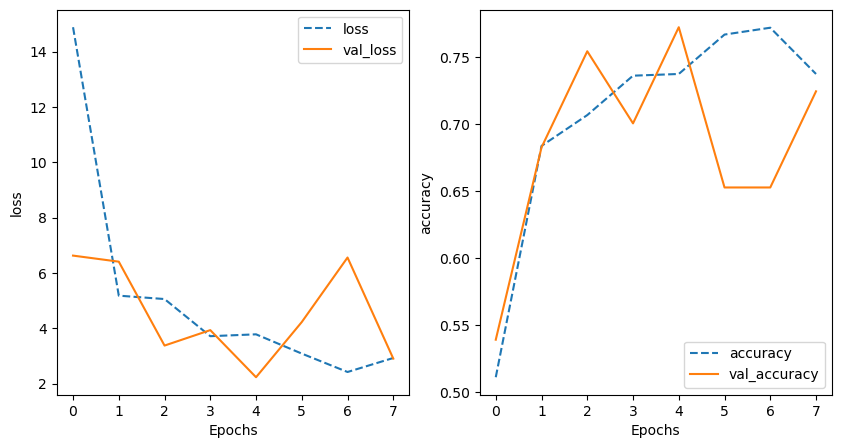

In [10]:
training_plot(['loss', 'accuracy'], history)

**1. Training Progress:**

The model's test accuracy on the training set is 71.59% and training accuracy starts at 51.09% and improves to 71.60%, which is a good sign of learning.
However, the training loss fluctuates, which could indicate that the model is struggling to consistently learn from the data across epochs.

**2. Validation Performance:**

The validation accuracy starts at 53.89% and reaches a high of 72.46% but doesn't show consistent improvement across epochs. This could suggest that the model is not generalizing well to unseen data.
The volatility can be a sign of overfitting.

**3. Early Stopping:**

Training should stop when the validation loss stops decreasing and starts to increase that why it stopped only echos 8

though a more complex structure can be used as a simple model can be underfit

1/1 [==============================] - 0s 26ms/step


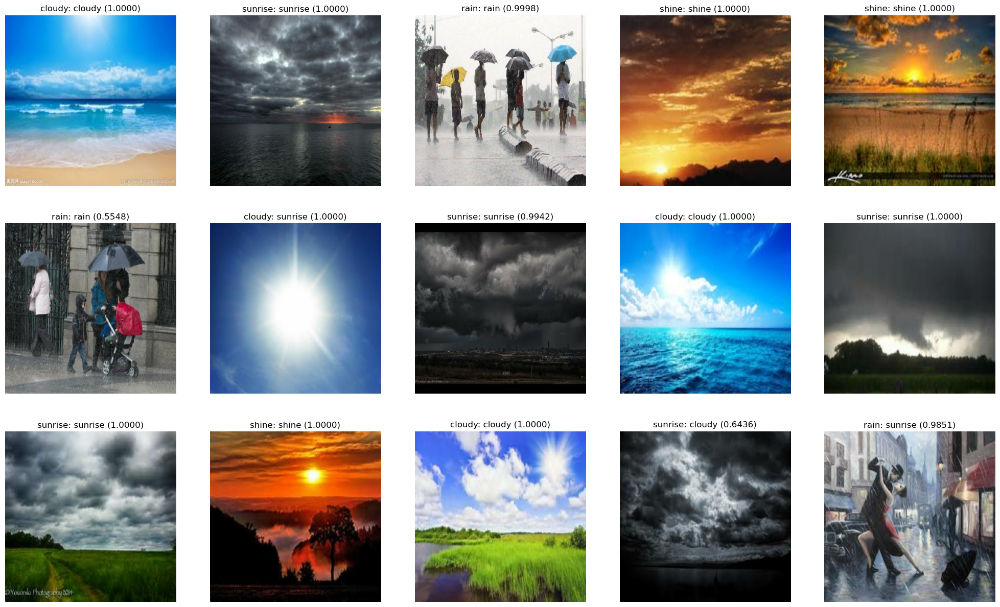

In [11]:
plot_predictions(model_simple, "validation.csv")

These are some example predictions which shows shine is mostly predicted right

### 2.2 A more complex classifier (2 marks)

Try a more complex architecture that has 1 or more hidden layers with dropout. For this more complex architecture, use `keras-tuner` and run it with a reasonable choice of possible parameters. You may try among the following:

- Number of hidden layers
- Sizes of hidden layers
- Dropout rate
- Learning rate

In [129]:
batch_size = 32  # Define your batch size
# Apply batching to the datasets so that my model can work well
train_dataset_1 = train_dataset.batch(batch_size)
validation_dataset_1 = validation_dataset.batch(batch_size)
test_dataset_1 = validation_dataset.batch(batch_size)

In [13]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from keras_tuner import RandomSearch, HyperParameters

# Defining the model-building function
def build_model(hp: HyperParameters):
    hp_units = hp.Int('units', min_value=16, max_value=128, step=16)
    hp_learning_rate = hp.Choice('learning_rate', values=[1e-2, 1e-3, 1e-4, 1e-5, 1e-6])
    hp_dropout = hp.Float('dropout', min_value=0.1, max_value=0.5, step=0.1)

    model = models.Sequential()
    model.add(layers.Flatten(input_shape=(230, 230, 3)))
    model.add(layers.Dense(units=hp_units, activation='relu'))
    model.add(layers.Dropout(rate=hp_dropout))
    model.add(layers.Dense(units=hp_units, activation='relu'))
    model.add(layers.Dropout(rate=hp_dropout))
    model.add(layers.Dense(4, activation='softmax'))
    model.compile(
        optimizer=keras.optimizers.Adam(learning_rate=hp_learning_rate),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model




# Defining the RandomSearch tuner with max_trials set to 3
# Defining the RandomSearch tuner without specifying a directory
tuner = RandomSearch(
    build_model,
    objective='val_accuracy',
    max_trials=3,
    executions_per_trial=1,
    project_name='image_classification_random_search',
    directory=None  # Not specifying a directory
)

# Starting  the search process
tuner.search(
    train_dataset_1,
    epochs=10,
    validation_data=validation_dataset_1,
    callbacks=[keras.callbacks.EarlyStopping(patience=1)]
)

# for getting the best hyperparameters
best_hps = tuner.get_best_hyperparameters(num_trials=1)[0]

Trial 3 Complete [00h 00m 32s]
val_accuracy: 0.7844311594963074

Best val_accuracy So Far: 0.7844311594963074
Total elapsed time: 00h 01m 14s


The tuner tested 3 different configurations of your neural network model, varying the number of units in the dense layers, the learning rate, and the dropout rate.
Each trial was run for up to 10 epochs, but training could stop early if no improvement in validation accuracy was observed (due to the early stopping callback with patience=1).

After 3 trail validation accuracy comes up to 78.44% with best val_accuracy so far was stated as 78.44% validation accuracy comes up to best accuracy result which is possible when by randomisation best hyperparameters are selected

In [14]:
# for evaluation purpose tuner.search does not provide a history of accuracy it stores therefore we have to fit the model accuracy in tuner and gives out the best one
best_model = tuner.hypermodel.build(best_hps)

# Train the best model
history_2 = best_model.fit(
    train_dataset_1,
    epochs=10,
    validation_data=validation_dataset_1,
    callbacks=[keras.callbacks.EarlyStopping(patience=1)]
)


Epoch 1/10
25/25 [==============================] - 6s 209ms/step - loss: 1.2561 - accuracy: 0.4469 - val_loss: 0.9090 - val_accuracy: 0.6228
Epoch 2/10
25/25 [==============================] - 5s 187ms/step - loss: 0.9519 - accuracy: 0.5915 - val_loss: 0.8310 - val_accuracy: 0.7246
Epoch 3/10
25/25 [==============================] - 5s 186ms/step - loss: 0.8722 - accuracy: 0.6338 - val_loss: 0.7846 - val_accuracy: 0.6766
Epoch 4/10
25/25 [==============================] - 5s 183ms/step - loss: 0.8584 - accuracy: 0.6517 - val_loss: 0.7618 - val_accuracy: 0.7066
Epoch 5/10
25/25 [==============================] - 5s 183ms/step - loss: 0.8290 - accuracy: 0.6287 - val_loss: 0.7202 - val_accuracy: 0.7844
Epoch 6/10
25/25 [==============================] - 5s 184ms/step - loss: 0.7793 - accuracy: 0.6773 - val_loss: 0.6984 - val_accuracy: 0.7964
Epoch 7/10
25/25 [==============================] - 5s 190ms/step - loss: 0.7661 - accuracy: 0.6965 - val_loss: 0.6960 - val_accuracy: 0.7425
Epoch 

Accuracy came as 71.45% as and validation accuracy is around 76.05%  better than the simple model

In [15]:
test_loss_2, test_accuracy_2 = best_model.evaluate(test_dataset_1)
print(f"Test accuracy: {test_accuracy_2 * 100:.2f}%")

6/6 [==============================] - 1s 191ms/step - loss: 0.6661 - accuracy: 0.7605
Test accuracy: 76.05%


Test accuracy is 76.05%

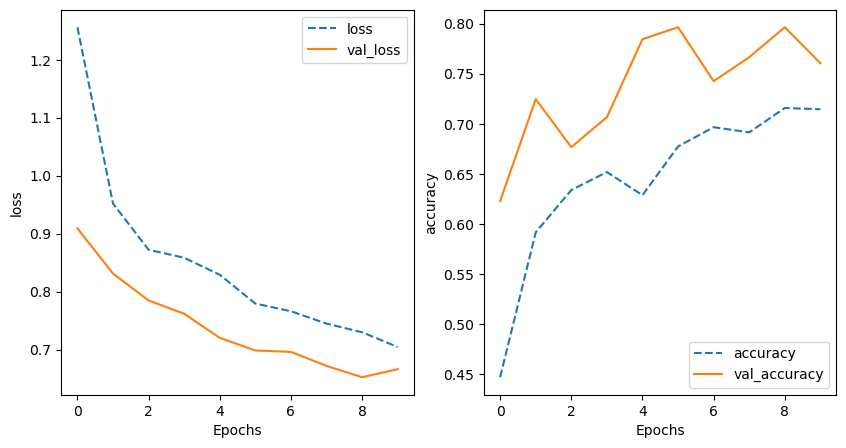

In [17]:
training_plot(['loss', 'accuracy'], history_2)

In [16]:
# Display the best hyperparameters
print(f"Best number of units: {best_hps.get('units')}")
print(f"Best learning rate: {best_hps.get('learning_rate')}")
print(f"Best dropout rate: {best_hps.get('dropout')}")

# Rebuild the model with the best hyperparameters and train it
model = tuner.hypermodel.build(best_hps)

# You can train the model (model.fit(...)) on your full dataset here if needed

# Display the best model's performance
best_trial = tuner.oracle.get_best_trials(num_trials=1)[0]
print(f"Best test accuracy: {best_trial.score}")

Best number of units: 96
Best learning rate: 1e-05
Best dropout rate: 0.30000000000000004
Best test accuracy: 0.7844311594963074


1. Best number of units: 962. 
Best learning rate: 1e-0
3. Best test accuracy: 0.7844311594963074
4. 
Best dropout rate: 0.300000000000000
074

I've implemented a more complex neural network architecture using Keras Tuner to optimize the hyperparameters and improve model performance. The model is designed for a classification task with four possible outcomes.
Decision about architecture of model involves:

1. Flatten layer :The model starts with a Flatten layer to convert the 2D image data into a 1D array.
2. Dense Layer:Each dense layer is followed by a Dropout layer, which helps prevent overfitting by randomly setting a fraction of the input units to 0 at each update during training time.
3. Hyperparameter Tuning:
    i. Number of Units: The number of units in each dense layer is varied between 16 and 128. This range is chosen to provide the model with enough flexibility to learn complex patterns without causing overfitting.
    
    
    ii. Learning Rate: The learning rate choices range from 1e-2 to 1e-6. The learning rate is crucial for convergence during training; too high a rate can cause the model to overshoot the minimum, while too low a rate can result in slow convergence.
   
   
   iii. Dropout Rate: The dropout rate varies between 0.1 and 0.5. This range is typical for dropout, providing a balance between regularizing the model and allowing it to learn effectively.

1/1 [==============================] - 0s 28ms/step


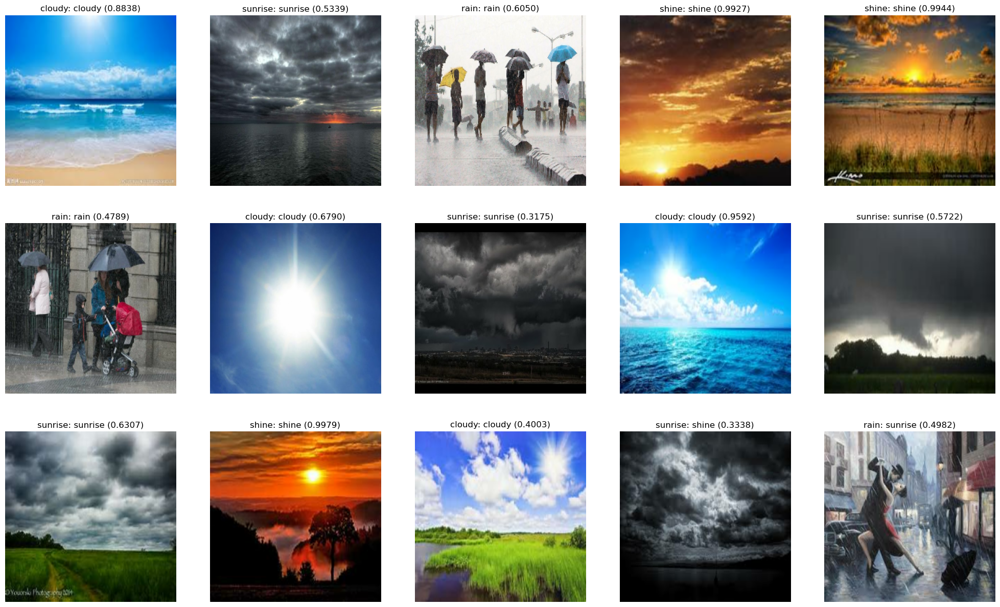

In [18]:
plot_predictions(best_model, "validation.csv")


Here also shine is prediction has highest score

### 2.3 Error analysis (1 mark)

Evaluate your best-performing system from task 2 against the system of task 1 and answer the following questions.

1. Which system had a better accuracy on the test data?
2. Which system had a lower degree of overfitting?

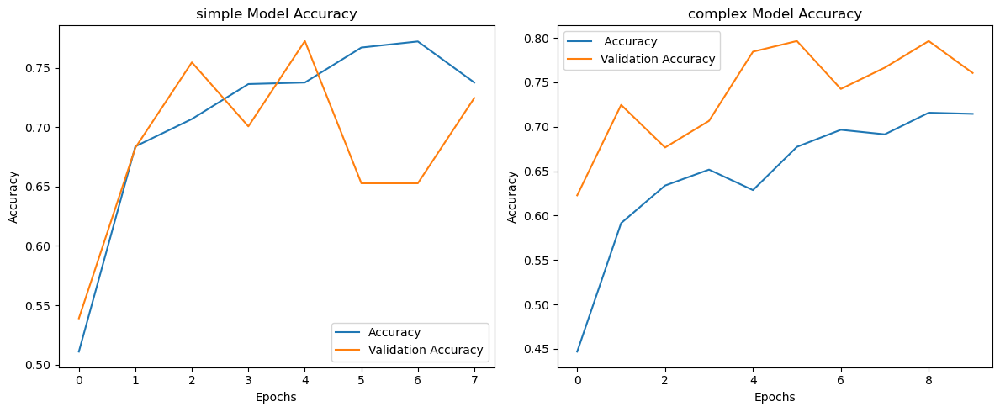

Text(0, 0.5, 'Loss')

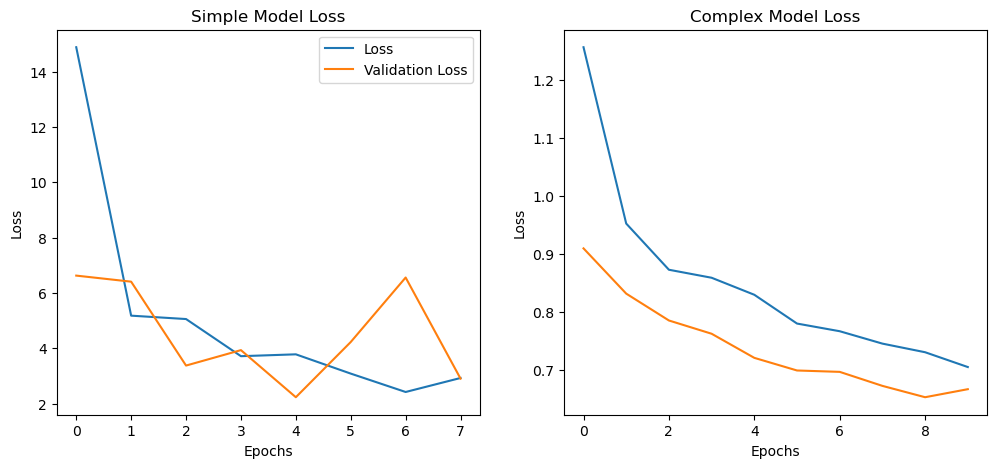

In [69]:
import matplotlib.pyplot as plt

# Plotting training and validation accuracy
plt.figure(figsize=(12,5))

# Task 1 Model Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('simple Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


# Task 2 Model Accuracy
plt.subplot(1, 2, 2)
plt.plot(history_2.history['accuracy'], label=' Accuracy')
plt.plot(history_2.history['val_accuracy'], label='Validation Accuracy')
plt.title('complex Model Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()
# Plotting training and validation loss
plt.figure(figsize=(12, 5))

# simple Model Loss
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Simple Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

# complex Model Loss
plt.subplot(1, 2, 2)
plt.plot(history_2.history['loss'], label='Loss')
plt.plot(history_2.history['val_loss'], label='Validation Loss')
plt.title('Complex Model Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')



1. Simple model has a better training accuracy graph  set it starts a low level below 50% compared to complex which started at below 45% but with time simple model accuracy has increased to more than 75%.Complex model has better validation accuracy always more than 65%  even reached 80% whereas for simple it lie mostly between 50%to 75% .

**Conclusion** : though test accuracy of complex model is more 76.05% as compared to 71.95% of simple model

2. In A simple model training accuracy increases as well as validation accuracy starts falling down and epochs stop for simple model .where as their is a large gap between the training accuracy and validation accuracy of complex model representing there is overfitting and also, when training accuracy increases and validation accuracy is decreasing and vica versa in complex model.

**Conclusion**:Therefore simple model has a low degree of overfitting

## Task 3 - A more complex classifier (5 marks)

### Task 3.1 Using ConvNets (2 marks)

Implement a model that uses a sequence of at least two `ConvD`, each one followed with `MaxPooling2D`. Use reasonable numbers for the hyperparameters (number of filters, kernel size, pool size, activation, etc), base on what we have seen in the lectures. Feel free to research the internet and / or generative AI to help you find a reasonable choice of hyperparameters. For this task, do not use pre-trained models.

In [112]:
import tensorflow as tf
from tensorflow.keras import layers, models

def create_convnet_model(input_shape=(230, 230, 3), num_classes=4):
    model = models.Sequential()
    
    # First Convolutional Block referenced to lectures
    model.add(layers.Conv2D(filters=32, kernel_size=3, activation='relu', input_shape=input_shape))
    model.add(layers.MaxPooling2D((2, 2)))

    # Second Convolutional Block
    model.add(layers.Conv2D(filters=64, kernel_size=3, activation='relu'))
    model.add(layers.MaxPooling2D((2, 2)))

    # Flatten and Dense layers
    model.add(layers.Flatten())
    model.add(layers.Dense(128, activation='relu'))
    model.add(layers.Dense(num_classes, activation='softmax'))  
    # Compile the model
    model.compile(optimizer='adam',
                  loss='categorical_crossentropy',
                  metrics=['accuracy'])
    return model

# Create the model
model = create_convnet_model()
model.summary()





Model: "sequential_22"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_24 (Conv2D)          (None, 228, 228, 32)      896       
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 114, 114, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_25 (Conv2D)          (None, 112, 112, 64)      18496     
                                                                 
 max_pooling2d_25 (MaxPoolin  (None, 56, 56, 64)       0         
 g2D)                                                            
                                                                 
 flatten_15 (Flatten)        (None, 200704)            0         
                                                                 
 dense_33 (Dense)            (None, 128)             

In [114]:
# Train the model
from tensorflow.keras.callbacks import ModelCheckpoint

checkpoint = ModelCheckpoint('model.h5', save_best_only=True, monitor='val_loss', mode='min')
history_3=model.fit(train_dataset_1, validation_data=validation_dataset_1, epochs=10, callbacks=[checkpoint])


# After training, evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(test_dataset_1)
print(f"Test accuracy: {test_accuracy * 100:.2f}%")


Epoch 1/10
25/25 [==============================] - 12s 477ms/step - loss: 0.0710 - accuracy: 0.9744 - val_loss: 0.8066 - val_accuracy: 0.8204
Epoch 2/10
25/25 [==============================] - 13s 513ms/step - loss: 0.0334 - accuracy: 0.9885 - val_loss: 0.4546 - val_accuracy: 0.8982
Epoch 3/10
25/25 [==============================] - 11s 454ms/step - loss: 0.0713 - accuracy: 0.9770 - val_loss: 0.5753 - val_accuracy: 0.9042
Epoch 4/10
25/25 [==============================] - 12s 464ms/step - loss: 0.0846 - accuracy: 0.9757 - val_loss: 0.4843 - val_accuracy: 0.8982
Epoch 5/10
25/25 [==============================] - 12s 461ms/step - loss: 0.0548 - accuracy: 0.9834 - val_loss: 0.4571 - val_accuracy: 0.9042
Epoch 6/10
25/25 [==============================] - 12s 465ms/step - loss: 0.0467 - accuracy: 0.9885 - val_loss: 0.5074 - val_accuracy: 0.8862
Epoch 7/10
25/25 [==============================] - 12s 473ms/step - loss: 0.0274 - accuracy: 0.9949 - val_loss: 0.4850 - val_accuracy: 0.9341

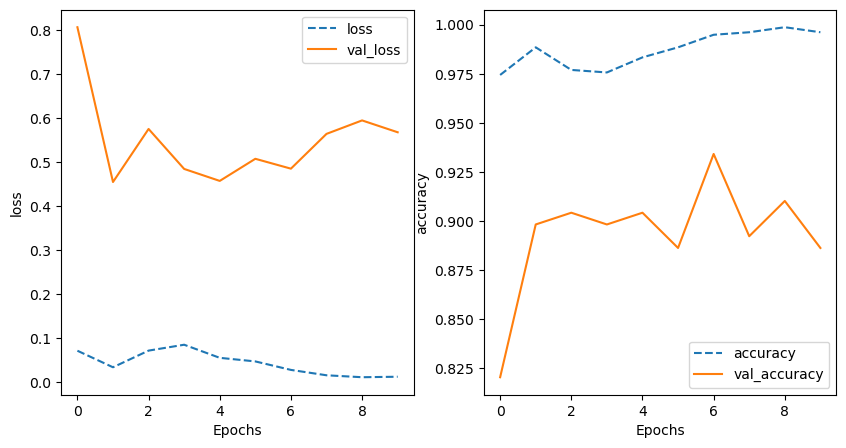

In [115]:
training_plot(['loss', 'accuracy'], history_3)

Test accuracy for this model is 88.62%.That shows model predict very accurately may be due to hyperparameters used .
I have used the hyperparameters taught in the lecture that have resulted in a high accuracy 

1/1 [==============================] - 0s 29ms/step


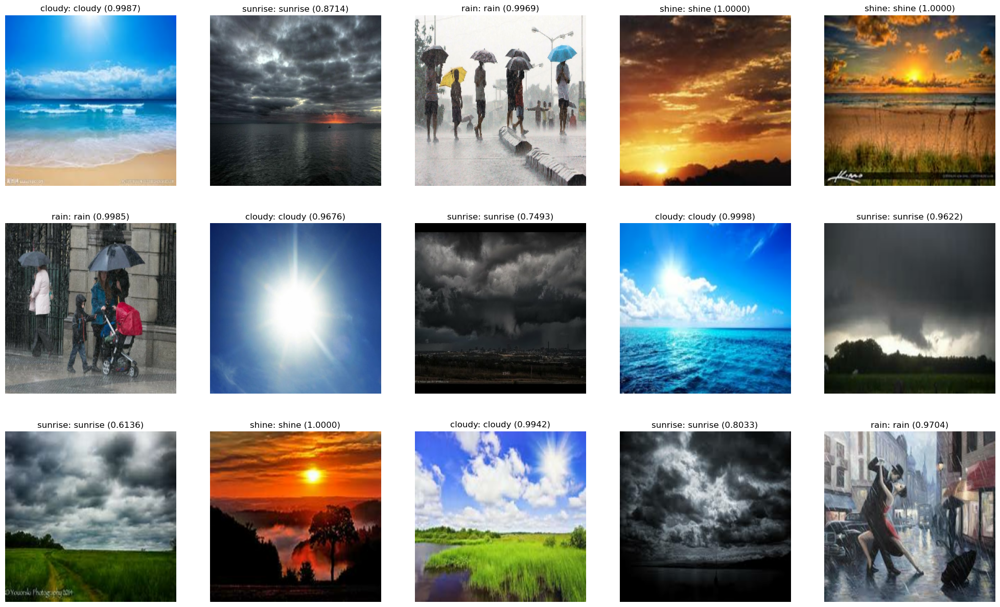

In [23]:
plot_predictions(model, "validation.csv")


Shine ,cloudy and rain have high prediction here .Model works well for most of weather prediction

### Task 3.2 Using pre-trained models (2 marks)

Use MobileNet, pre-trained on imagenet as discussed in the lectures. Add the correct classification layer, and train it with your data. Make sure that you freeze MobileNet's weights during training. Also, make sure you use a reasonable schedule for the learning rate.

Learning rate schedule: 0.0001 to 0.0001 to 1.41e-05


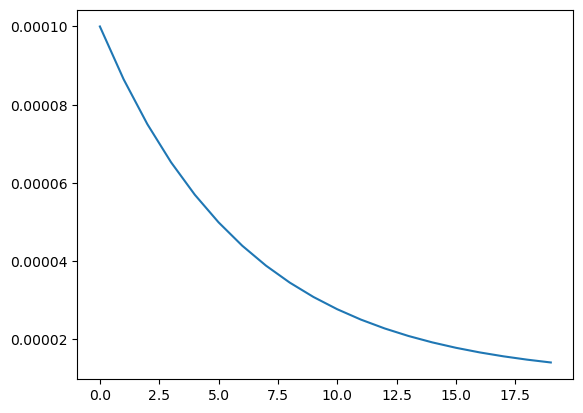

In [64]:
EPOCHS = 20
# Learning rate schedule
LR_START = 0.0001
LR_MAX = 0.0001
LR_MIN = 0.00001
LR_RAMPUP_EPOCHS = 0
LR_SUSTAIN_EPOCHS = 0
LR_EXP_DECAY = 0.85

def lrfn(epoch):
    if epoch < LR_RAMPUP_EPOCHS:
        lr = (LR_MAX - LR_START) / LR_RAMPUP_EPOCHS * epoch + LR_START
    elif epoch < LR_RAMPUP_EPOCHS + LR_SUSTAIN_EPOCHS:
        lr = LR_MAX
    else:
        lr = (LR_MAX - LR_MIN) * LR_EXP_DECAY ** (epoch - LR_RAMPUP_EPOCHS - LR_SUSTAIN_EPOCHS) + LR_MIN
    return lr

lr_callback = tf.keras.callbacks.LearningRateScheduler(lrfn, verbose=True)

rng = [i for i in range(EPOCHS)]
y = [lrfn(x) for x in rng]

plt.plot(rng, y)
print(f"Learning rate schedule: {y[0]:.3g} to {max(y):.3g} to {y[-1]:.3g}")

Learning rate schedule: 0.0001 to 0.0001 to 1.41e-05 with echos =20

In [95]:
import tensorflow as tf

CLASS_NAMES=["shine","cloudy","rain","sunrise"]

# Fetching the MobileNet model as shown in lecture
mobilenet_model = tf.keras.applications.MobileNet(weights="imagenet",
                                                  input_shape=(230, 230, 3),
                                                  include_top=False, #freezing weights
                                                  pooling="avg")

# Setting the layers of MobileNet to be non-trainable
for layer in mobilenet_model.layers:
    layer.trainable =False

# Constructing the final model
model_mobilenet = tf.keras.Sequential()
model_mobilenet.add(mobilenet_model)
model_mobilenet.add(tf.keras.layers.Dense(len(CLASS_NAMES), activation='softmax', name='weather_prob'))  

# Compiling the model
model_mobilenet.compile(
    optimizer="adam",
    loss='categorical_crossentropy',
    metrics=['categorical_accuracy']
)

# To display the model's architecture
model_mobilenet.summary()

Model: "sequential_21"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 mobilenet_1.00_224 (Functio  (None, 1024)             3228864   
 nal)                                                            
                                                                 
 weather_prob (Dense)        (None, 4)                 4100      
                                                                 
Total params: 3,232,964
Trainable params: 4,100
Non-trainable params: 3,228,864
_________________________________________________________________


MobileNet, when pre-trained on ImageNet, expects one of the following input resolutions: 128x128, 160x160, 192x192, or 224x224. Since we're using 230x230, TensorFlow automatically adjusts to use the closest available resolution, which is 224x224.



In [35]:
history_4= model_mobilenet.fit(train_dataset_1, validation_data=validation_dataset_1, epochs=20,
                    callbacks=[lr_callback,tf.keras.callbacks.EarlyStopping(monitor="val_loss",
                                                                patience=2)])


Epoch 1: LearningRateScheduler setting learning rate to 0.0001.
Epoch 1/20
25/25 [==============================] - 10s 394ms/step - loss: 0.7361 - categorical_accuracy: 0.7593 - val_loss: 0.7424 - val_categorical_accuracy: 0.7545 - lr: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 8.65e-05.
Epoch 2/20
25/25 [==============================] - 10s 402ms/step - loss: 0.6761 - categorical_accuracy: 0.7900 - val_loss: 0.6956 - val_categorical_accuracy: 0.7904 - lr: 8.6500e-05

Epoch 3: LearningRateScheduler setting learning rate to 7.5025e-05.
Epoch 3/20
25/25 [==============================] - 10s 407ms/step - loss: 0.6324 - categorical_accuracy: 0.8054 - val_loss: 0.6609 - val_categorical_accuracy: 0.8024 - lr: 7.5025e-05

Epoch 4: LearningRateScheduler setting learning rate to 6.527125e-05.
Epoch 4/20
25/25 [==============================] - 10s 393ms/step - loss: 0.5994 - categorical_accuracy: 0.8259 - val_loss: 0.6342 - val_categorical_accuracy: 0.8024 - lr: 6.5

On a pre Trained model categorical accuracy is 89.24% and loss is 44.56% and val_loss and val_categorical accuracy is 50.24% and 85.63%.Thats shows model is trained well on test dataset and is a good predictor for unseen data but with high losses as well.

In [56]:
test_loss_4, test_accuracy_4 = model_mobilenet.evaluate(test_dataset_1)
print(f"Test accuracy: {test_accuracy_4 * 100:.2f}%")

6/6 [==============================] - 2s 239ms/step - loss: 0.5024 - categorical_accuracy: 0.8563
Test accuracy: 85.63%


Test accuracy for mobilenet model is 85.63%.

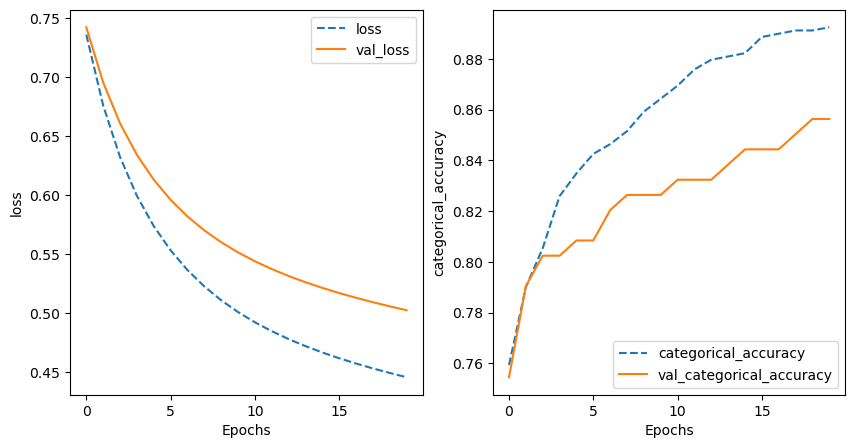

In [72]:
training_plot(['loss', 'categorical_accuracy'], history_4)

1/1 [==============================] - 0s 72ms/step


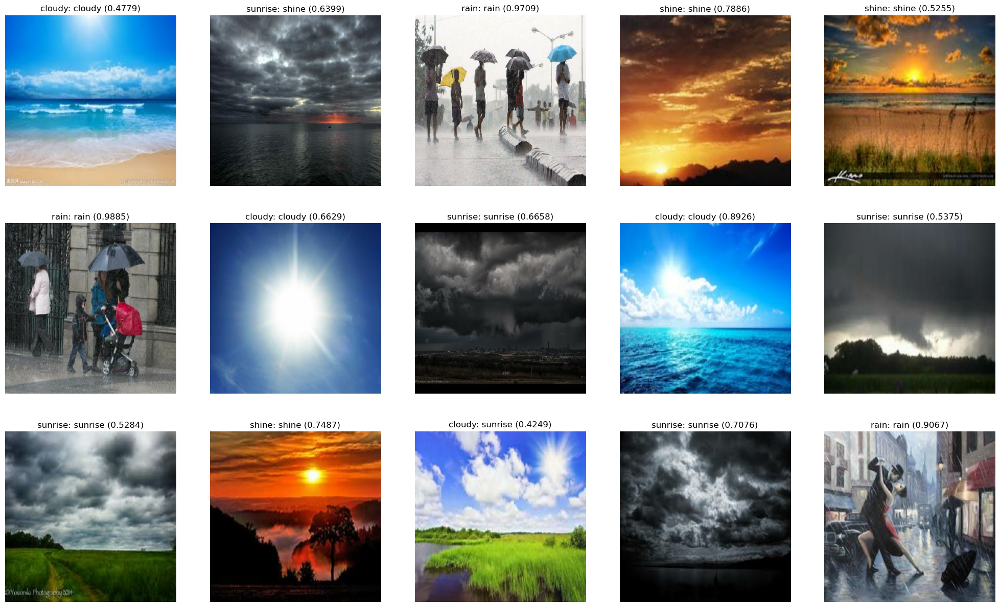

In [61]:
plot_predictions(model_mobilenet, "validation.csv")

Cloudy an rain have high prediction accuracy values

### Task 3.3 Comparative evaluation (1 mark)

Compare the evaluation results of the best systems from tasks 3.1 and 3.2 and answer the following questions.

1. What system (including the systems you developed in Task 2) perform best on the test set?
2. Report the accuracy of your best system on each of the different weather categories. What type of weather was most difficult to detect?

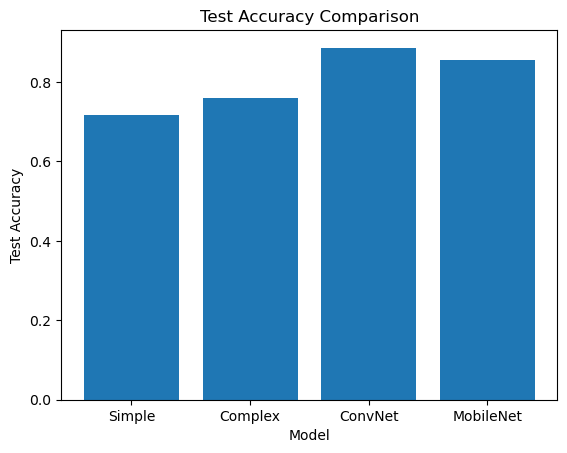

In [116]:

#the test accuracy of the simple model from 2.1
test_accuracy_simple = test_accuracy_simple # Directly use the accuracy value

# For the complex model, using val_accuracy as proxy
test_accuracy_complex = test_accuracy_2  # Last validation accuracy

# For the convnet model, 
test_accuracy_convnet = test_accuracy  

# Last validation accuracy as proxy
test_accuracy_mobilenet = test_accuracy_4 
# Plotting the accuracies using matplotlib
import matplotlib.pyplot as plt

accuracies = [test_accuracy_simple, test_accuracy_complex, test_accuracy_convnet, test_accuracy_mobilenet]
model_names = ['Simple', 'Complex', 'ConvNet', 'MobileNet']
import matplotlib.pyplot as plt
plt.bar(model_names, accuracies)
plt.xlabel('Model')
plt.ylabel('Test Accuracy')
plt.title('Test Accuracy Comparison')
plt.show()


In [117]:
print("test accuracy of simple model is :",accuracies[0])
print("test accuracy of complex model is :",accuracies[1])
print("test accuracy of convnet model is :",accuracies[2])
print("test accuracy of mobilenet model is :",accuracies[3])

test accuracy of simple model is : 0.715976357460022
test accuracy of complex model is : 0.7604790329933167
test accuracy of convnet model is : 0.886227548122406
test accuracy of mobilenet model is : 0.85628741979599


In [119]:
highest_accuracy_index = np.argmax(accuracies)
# Find the name of the model with the highest accuracy
highest_acc_model_name = model_names[highest_accuracy_index]

print(f"The highest accuracy model is {highest_acc_model_name} with an accuracy of {accuracies[highest_accuracy_index]:.2f}")

The highest accuracy model is ConvNet with an accuracy of 0.89


Test accuracies of mobilenet(85.62%) and convenet(88.62%) model are having less difference But both are having accuracy higher than simple and complex.Though ,simple model has the least accuracy of 71.59%.

**conclusion**: ConvNets model performs best on test data

#### 2) PREDICTION ON BETTER SYSTEM that is ConvNets

In [127]:
models = [model_simple, best_model, model, mobilenet_model]
# Get the best model
better_system = models[highest_accuracy_index]

In [128]:
import numpy as np
from sklearn.metrics import classification_report, confusion_matrix

# Initialize lists to hold the true labels and predictions
true_labels = []
predicted_labels = []

# Loop through the dataset
for images, labels in test_dataset_1:
    # Predict the batch
    preds = better_system.predict(images)
    # Convert predictions and labels to the correct format
    preds = np.argmax(preds, axis=1)
    labels = np.argmax(labels, axis=1)
    # Extend the lists
    true_labels.extend(labels)
    predicted_labels.extend(preds)

# Convert lists to numpy arrays for sklearn functions
true_labels = np.array(true_labels)
predicted_labels = np.array(predicted_labels)

# Generate a classification report
print(classification_report(true_labels, predicted_labels, target_names=CLASS_NAMES))

# Generate a confusion matrix
cm = confusion_matrix(true_labels, predicted_labels)
print(cm)


1/1 [==============================] - 0s 47ms/step
              precision    recall  f1-score   support

       shine       0.96      1.00      0.98        51
      cloudy       0.80      0.84      0.82        38
        rain       1.00      0.84      0.91        31
     sunrise       0.81      0.83      0.82        47

    accuracy                           0.89       167
   macro avg       0.89      0.88      0.88       167
weighted avg       0.89      0.89      0.89       167

[[51  0  0  0]
 [ 1 32  0  5]
 [ 1  0 26  4]
 [ 0  8  0 39]]


1. Precision: Indicates the accuracy of positive predictions for each class. For example, model predicts "shine," it is correct 96% of the time,cloudy is correct 80% ,rain is correct 100%,sunrise is correct 81%.

2. Recall: It depicts the ability of the model to detect all relevant instances for each class. For instance, it successfully identifies 84% of all "rain" instances, 100% instance for shine,84% instances for cloudy ,83% instances for sunrise .

3. F1-score:The closer the F1-score is to 1, the better the model's performance.for shine it is 0.98,cloudy it is 0.82,rain it is 0.91 ,sunrise it is 0.82.Among all this model performance is best for Shine.

Most difficult weather will be sunrise with low precision,recall and F1-score and easiest will be shine due to high overall score.

## Coding (1 mark)

This mark will be assigned to submissions that have clean and efficient code and good in-code documentation of all code presented in this assignment.

## GitHub Classroom (1 mark)

These marks will be given to submissions that:

- Have continuously committed changes to the GitHub repository at GitHub Classroom.
- The commit messages are useful and informative.

# Submission

Your submission should consist of this Jupyter notebook with all your code and explanations inserted into the notebook as text cells. **The notebook should contain the output of the runs. All code should run. Code with syntax errors or code without output will not be assessed.**

**Do not submit multiple files. If you feel you need to submit multiple files, please contact Diego.Molla-Aliod@mq.edu.au first.**

Examine the text cells of this notebook so that you can have an idea of how to format text for good visual impact. You can also read this useful [guide to the MarkDown notation](https://daringfireball.net/projects/markdown/syntax), which explains the format of the text cells.

Each task specifies a number of marks. The final mark of the assignment is the sum of all the marks of each individual task.

By submitting this assignment you are acknowledging that this is your own work. Any submissions that break the code of academic honesty will be penalised as per [the academic integrity policy](https://policies.mq.edu.au/document/view.php?id=3).

## A note on the use of AI code generators

In this assignment, we view AI code generators such as copilot, CodeGPT, etc as tools that can help you write code quickly. You are allowed to use these tools, but with some conditions. To understand what you can and what you cannot do, please visit these information pages provided by Macquarie University.

- Artificial Intelligence Tools and Academic Integrity in FSE - https://bit.ly/3uxgQP4

If you choose to use these tools, make the following explicit in your Jupyter notebook, under a section with heading "Use of AI generators in this assignment" :

- What part of your code is based on the output of such tools,
- What tools you used,
- What prompts you used to generate the code or text, and
- What modifications you made on the generated code or text.

This will help us assess your work fairly.
